# Background of the Research

One of the most time-honored traditions of Cartographers and their nerdy offspring Geographic Information Systems technicians is the pursuit of the ability to create the most precise map available given whatever constraints may be applied to the situation. As our ability to process data has increased, so have the number of ways this goal is approached. One such method is the use of Dasymetric Mapping.

Dasymetric mapping improves the accuracy of maps by increasing the spatial resolution of the dataset being analyzed. It  involves using a more detailed classification of data and applying it to the map in a way that shows a closer approximation of the spatial relationship between the characteristic and the place, rather than applying it broadly administrative units. Simply, dasymetric mapping is one way to represent the complexity of the relationship between data and space by considering real world factors like where people live, grow food, hike through the woods, or commute to work.

Though dasymetric mapping dates back to the early 1900s, the time required made this area a relatively underutilized method.  As it stands today, dasymetric mapping is becoming increasingly utilized in a variety of fields like, emergency and urban planning, public health, and environmental science. Computers and remote sensing equipment have allowed for more precise data to be collected and analyzed, and many software packages make creating dasymetric maps a much less laborious process. For this project I will use a variety of these packages in a Jupyter Notebook to explore dasymetric mapping. One of the packages I relied on most heavily for this project is Tobler, which is part of the PySal library. This is extremely fitting as the package’s namesake Waldo Tobler headed the Global Demography Project, which among other techniques were able to increase the accuracy of global population mapping by two orders of magnitude than had been previously available (Tobler, 1995)  

There are many ways to go about making a dasymetric map. Generally the workflow for this sort of project is to clearly identify the geographic area of interest and gather the required spatial data. This is usually in the form of a shapefile or raster image (e.g. GeoTIFF). For this project, I chose to focus on Norfolk, VA because of my familiarity with the area and I gathered data from the National Land Cover Database and the Census Bureau. My data came in the form of both downloaded data, and data pulled directly into my notebook using the Census Bureau’s API.

The next step is to identify what variables are to be analyzed. I decided to create population density maps for this project. I admit that this is mostly for convenience as there are several ways to connect a Jupyter Notebook to both the NLCD and Census APIs. However, I did also gather NLCD and Census tract data from the ESRI portal. 

Once data is gathered, you create a raster layer of the surface being analyzed. In my case, working with population in a city, I focused on the data in the NLCD raster with pixels coded as ‘Developed’.

After creating the base layer, you can use a variety of interpolation methods to distribute the data for your variable. For me, that meant interpolating my population data into developed areas.

The final step is to create a map from the layer created by interpolation.


# Justification of the Research Problem Definition

As I mentioned earlier, there are a large number of ways to go about creating a dasymetric map. Deciding which method is ‘best’ depends on a large number of variables, such as the reason for creating the map, what data is accessible, what software is available, and what the time constraints on a project are. For example, the needs of an emergency management GIS team with access to city data and the availability of a nice, user-friendly software suite (like ArcGIS Pro) will be entirely different than a team working for a non-profit with a software budget of zero dollars. The second team would need to be able to gather, process, and visualize data using open-source data and software. I chose to focus this project on how the second team could go about achieving their goals.

# Problem Definition

Population density maps are an important tool for researchers, planners, and emergency managers. While many commercial software packages can facilitate the demands of creating these maps, they are sometimes expensive and may not be a viable option for organizations with limited resources.

Python and Jupyter Notebooks are an open source option that may provide a solution for these organizations. However, open-source software may not always undergo the same strenuous development and quality assurance checks that commercial software packages undergo prior to release.

For this project, I will use several Python libraries in a Jupyter Notebook to create dasymetric population density maps for the city of Norfolk, VA. I will use three interpolation methods and assess the accuracy for each method. My final conclusions will be based on the ease with which the analysis can be done and the accuracy for each method.


# Problem Analysis

Tobler is a subpackage of the Python Spatial Analysis Library (PySAL) and has several interpolation methods. The first method I will use is Areal Interpolation. Areal Interpolation is the most basic method used in this project. It is the reaggregation of data from a set of source polygons to a set of target polygons, weighted according to the overlap between the two sets of polygons (PySAL Developers, 2018). 

Masked Areal Interpolation (MAI) works the same way, but it includes axillary data to create a mask that improves the resolution of data by removing areas from the target polygons that do not meet certain criteria. For this project, this would mean removing areas in Norfolk that are not classified as residential areas. 

Model-Based Interpolation improves on MAI by further splitting the masked areas into high and low values. This means that areas with ‘high intensity development’ will be weighted more than ‘low intensity development areas’ (PySAL Developers, 2018).  


# Technical Solution


## Required Packages

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np
import cenpy
import osmnx as ox
import pysal
from tobler.dasymetric import extract_raster_features
from tobler.area_weighted import area_interpolate
from tobler.dasymetric import masked_area_interpolate
from tobler.model import glm
from sklearn.metrics import r2_score

C:\Users\Admin\anaconda3\lib\site-packages\geopandas\_compat.py:123: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


OSMnx is a Python package that allows for easy download of data from OpenStreetMap for modeling, visualization and analysis (Boeing,2017).

Cenpy is a Python package that provides easy access to Census data in Python. (Cenpy Developers, 2018)

## Create Basemap Using American Community Survey Data

Text(0.5, 1.0, 'Norfolk, VA')

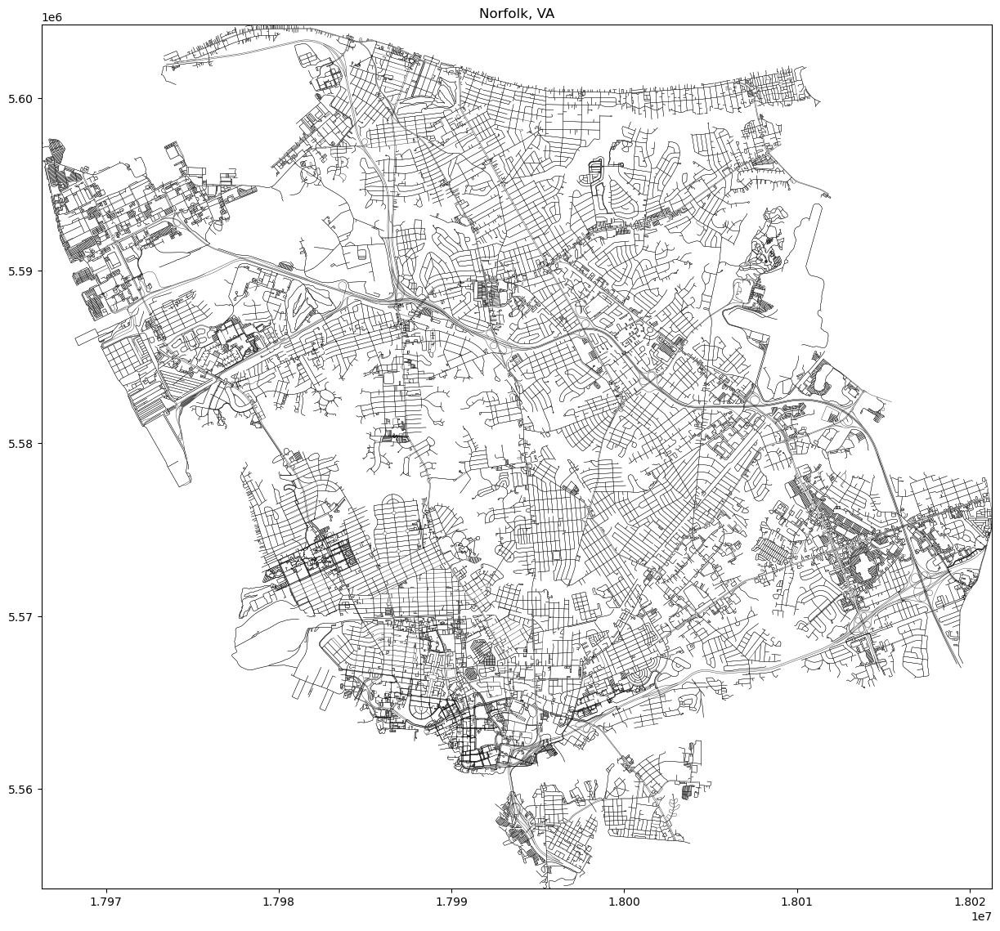

In [2]:
# Get Streets from OSMnx
orf_graph = ox.graph_from_place('Norfolk,VA')

# Pulls nodes and streets out of graph
orf_nodes, orf_streets  = ox.graph_to_gdfs(orf_graph) 

# Convert orf_streets to ESG Projection 2230
orf_streets= orf_streets.to_crs(2230)

# Plot Basemap
f,ax = plt.subplots(1,1, figsize=(15,15))
orf_streets.plot(linewidth=.25, ax=ax, color='k')
ax.axis(orf_streets.total_bounds[[0,2,1,3]])
ax.set_title('Norfolk, VA')

# Import Census Tract and Population Data

C:\Users\Admin\AppData\Roaming\Python\Python38\site-packages\pandas\core\dtypes\cast.py:1784: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values
C:\Users\Admin\anaconda3\lib\site-packages\cenpy\products.py:762: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  return self._from_name(county, variables, level, "Counties", **kwargs)


Matched: Norfolk,VA to Norfolk city within layer Incorporated Places


C:\Users\Admin\AppData\Roaming\Python\Python38\site-packages\pandas\core\dtypes\cast.py:1784: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values
C:\Users\Admin\AppData\Local\Temp\ipykernel_19304\3966573940.py:5: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  orf_data_place = cenpy.products.ACS(2019).from_place('Norfolk,VA', variables=['B02001_001E'])


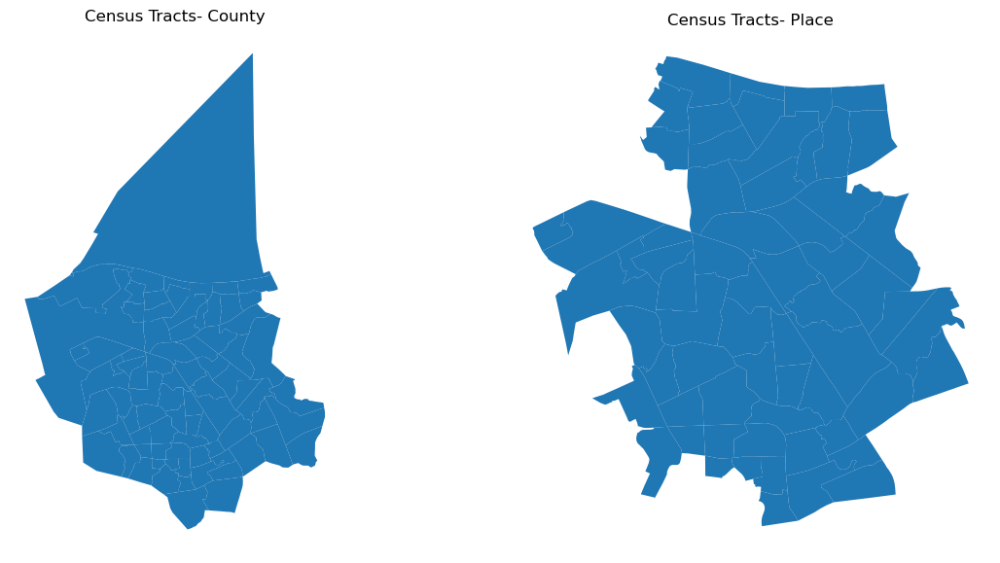

In [3]:
#Census Data from the American Community Survey at the county level
orf_census_cnty = cenpy.products.ACS(2019).from_county('Norfolk,VA', variables=['B02001_001E'])

#Census Data from the American Community Survey from place
orf_data_place = cenpy.products.ACS(2019).from_place('Norfolk,VA', variables=['B02001_001E'])

# Rename population total column from table code to readable name
orf_census_cnty=orf_census_cnty.rename(columns={'B02001_001E':'Pop_Tot'})
orf_data_place=orf_data_place.rename(columns={'B02001_001E':'Pop_Tot'})

# Convert to working projection
orf_census_cnty = orf_census_cnty.to_crs(2230)
orf_data_place = orf_data_place.to_crs(2230)

# Plot datasets for comparison
fig, ax = plt.subplots(1,2, figsize=(14,7))

orf_census_cnty.plot(ax=ax[0])
orf_data_place.plot(ax=ax[1])
ax[0].set_title('Census Tracts- County')
ax[1].set_title('Census Tracts- Place')
for ax in ax:
    ax.axis('off')

You can see that there is quite a difference between the two sets of polygons. Census Tracts from place is missing several so I will not use it. I do need to get rid of the large triangular tract (tract 9900) as it is all water and not relevant to this project.

<AxesSubplot: >

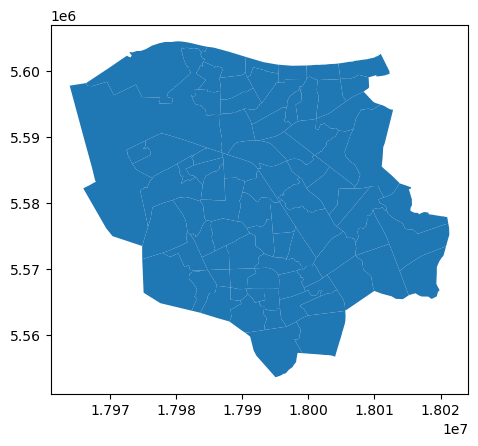

In [4]:
# Remove Census Tract 9900
orf_census= orf_census_cnty.drop(9, axis=0)

#Plot Census Tracts
orf_census.plot()

In [5]:
# Calculate the area of each census tract
orf_census['area'] = orf_census.geometry.area

# Calculate the population density of each tract
orf_census['pop_density'] = orf_census['Pop_Tot'] / orf_census['area']

In [6]:
orf_census

,GEOID,geometry,Pop_Tot,NAME,state,county,tract,area,pop_density
0,51710003700,"POLYGON ((17984793.870 5569849.221, 17985524.4...",2377.0,"Census Tract 37, Norfolk city, Virginia",51,710,003700,6.783839e+06,0.000350
1,51710004900,"POLYGON ((17988068.443 5562062.107, 17988383.2...",5249.0,"Census Tract 49, Norfolk city, Virginia",51,710,004900,2.146569e+07,0.000245
2,51710001500,"POLYGON ((17981442.210 5585150.104, 17981453.4...",2137.0,"Census Tract 15, Norfolk city, Virginia",51,710,001500,1.030041e+07,0.000207
3,51710002100,"POLYGON ((17989327.828 5577200.967, 17989377.8...",1426.0,"Census Tract 21, Norfolk city, Virginia",51,710,002100,1.967654e+07,0.000072
4,51710004700,"POLYGON ((17995876.653 5562662.236, 17995855.5...",2967.0,"Census Tract 47, Norfolk city, Virginia",51,710,004700,1.675353e+07,0.000177
...,...,...,...,...,...,...,...,...,...
76,51710001600,"POLYGON ((17980737.230 5582918.182, 17980981.6...",1954.0,"Census Tract 16, Norfolk city, Virginia",51,710,001600,5.702730e+06,0.000343
77,51710004100,"POLYGON ((17990718.007 5566501.593, 17990689.1...",2211.0,"Census Tract 41, Norfolk city, Virginia",51,710,004100,4.511478e+06,0.000490
78,51710000901,"POLYGON ((17973381.136 5585873.763, 17973512.5...",5782.0,"Census Tract 9.01, Norfolk city, Virginia",51,710,000901,3.671859e+07,0.000157
79,51710006100,"POLYGON ((17995611.589 5580191.306, 17995782.9...",7641.0,"Census Tract 61, Norfolk city, Virginia",51,710,006100,3.404096e+07,0.000224


# Create Mask from National Land Cover Database Raster

I wanted to explore two ways of creating a mask for interpolation. The first, is the tried and true method of downloading a raster file and clipping the census data polygons to match the areas identified in the raster as developed areas. The second is to create a GDB, using OSMNX, based on the streets with a buffer of 100ft and then clip that using the raster. I chose 100ft because the average setback for Norfolk, according to the Zoning FAQ on the cities website, is 25 ft. There was no information on standard deviations, so I just assumed 100 ft would cover most areas.


"What are the typical setbacks for residential properties?
Setbacks depend on the zoning of the parcel in question. Typically, for principal structures, there is a 25 foot front yard setback, 5 foot or 10 foot side yard setback, and 25 foot rear yard setback. For corner lots, there is a 10 or 25 foot corner side yard setback. Accessory structures have different setbacks then principal structures. Many times these setbacks will be altered by overlay districts."

https://www.norfolk.gov/FAQ.aspx?QID=594

## Import Raster and Extract Features for Analysis

In [7]:
# Path to nlcd raster on local machine
nlcd_lc= 'C:/Users/Admin/Documents/ODU/Spring 23/Capstone/USA_NLCD_Land_Cover__1.tif'

![NLCD Pixel Values](NLCD_Colour_Classification_Update.jpg)

The values I am looking for are  23 and 24. I will use them to set the pixel_values argument in extract_raster_features

<AxesSubplot: >

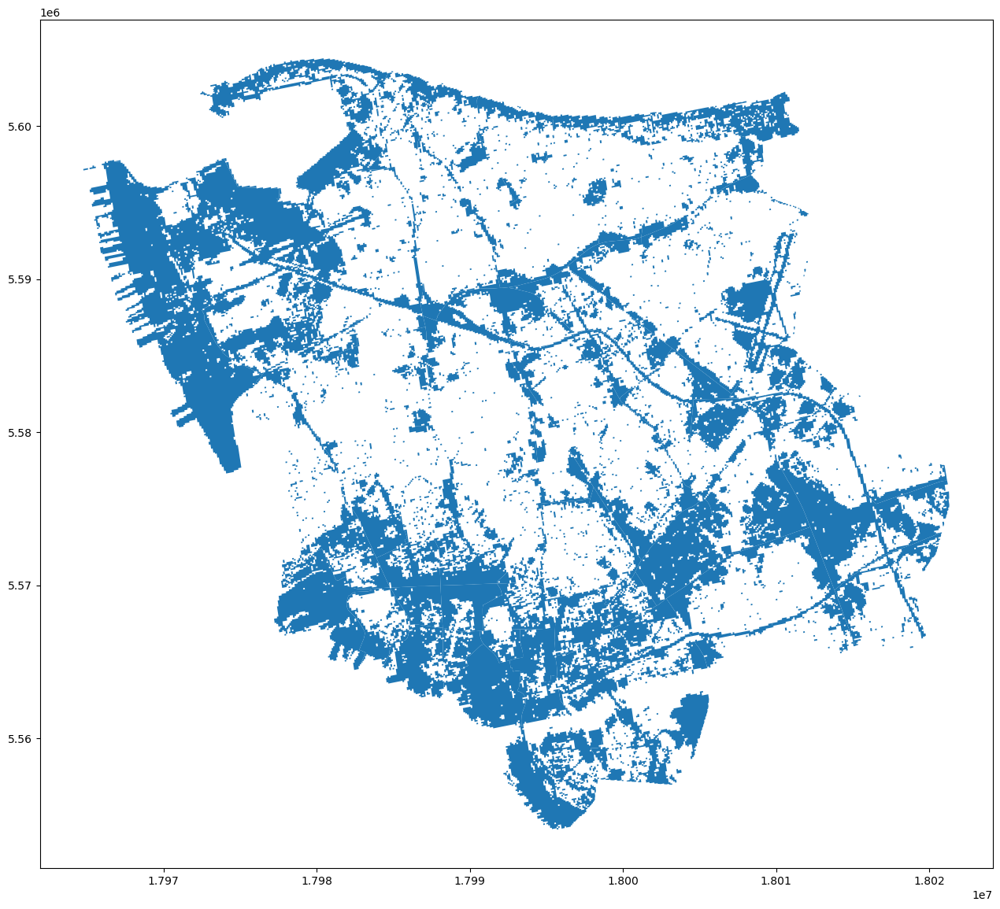

In [8]:
# Extract Raster Features
NLCD_fet = extract_raster_features(orf_census, nlcd_lc, pixel_values=[23,24], collapse_values=True)

#Convert ot working Projection
NLCD_fet = NLCD_fet.to_crs(2230)

# Clip Census tract data Using NLCD_Mask
NLCD_Mask = gpd.clip(orf_census,NLCD_fet)

# Replace any 'nan' values with '0'
NLCD_Mask.Pop_Tot = NLCD_Mask.Pop_Tot.fillna(0)

# convert orf_clip to projection
NLCD_Mask = NLCD_Mask.to_crs(2230)

#Plot mask
fig, ax = plt.subplots(figsize=(20,14))
NLCD_Mask.plot(ax=ax)

## Create Mask from OSMnx Using Roads

C:\Users\Admin\anaconda3\lib\site-packages\geopandas\tools\clip.py:67: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


<AxesSubplot: >

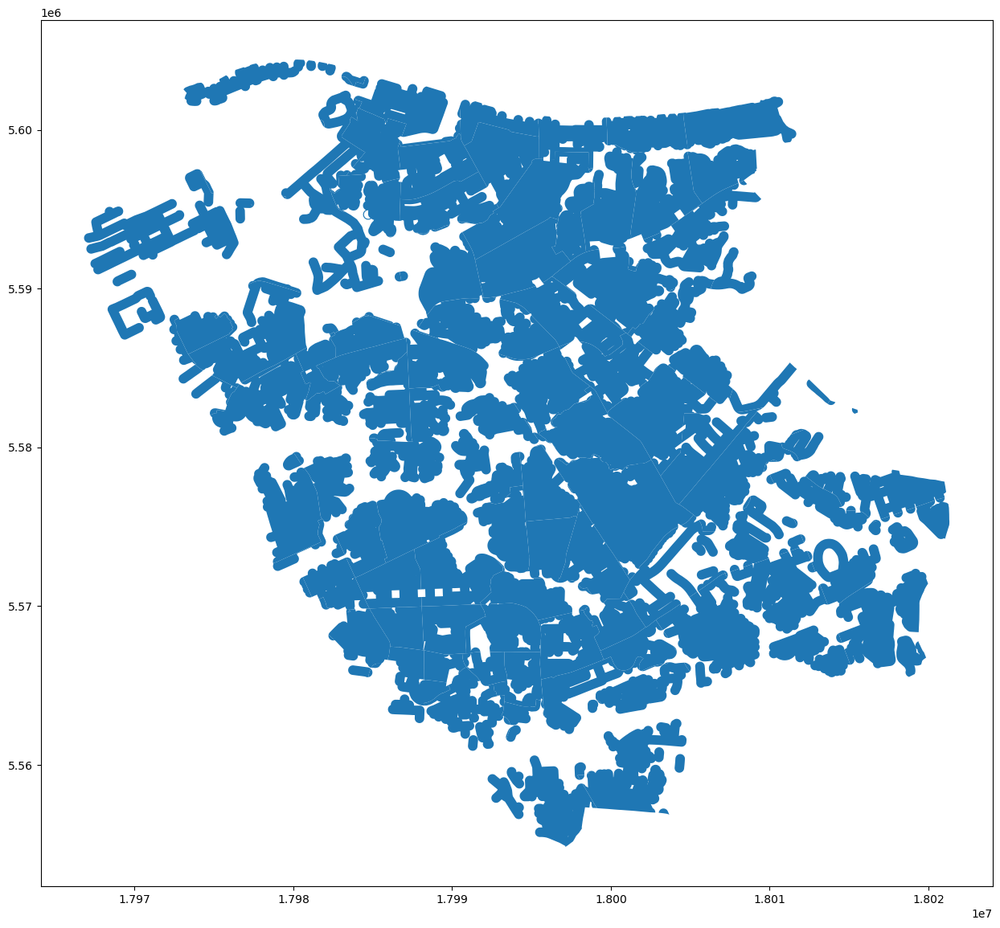

In [9]:
# Create a vector file for residential areas

roads_fet =  ox.geometries_from_place('Norfolk, Virginia',tags={'highway':'residential'}) 

# Convert to working projection
roads_fet = roads_fet.to_crs(2230)

# Create a 300ft buffer
roads_fet = roads_fet.buffer(300)

# Create a GDF for orf_raods
roads_fet = gpd.GeoDataFrame(geometry=roads_fet)

# Clip Census tract data Using NLCD_Mask
roads_mask = gpd.clip(orf_census,roads_fet)

# Replace any 'nan' values with '0'
roads_mask.Pop_Tot = roads_mask.Pop_Tot.fillna(0)

# convert orf_clip to projection
roads_mask = roads_mask.to_crs(2230)

#Plot the GDF
fig, ax = plt.subplots(figsize=(20,14))
roads_mask.plot(ax=ax)

## Create Mask Using OSMnx Landuse

C:\Users\Admin\anaconda3\lib\site-packages\geopandas\tools\clip.py:67: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


<AxesSubplot: >

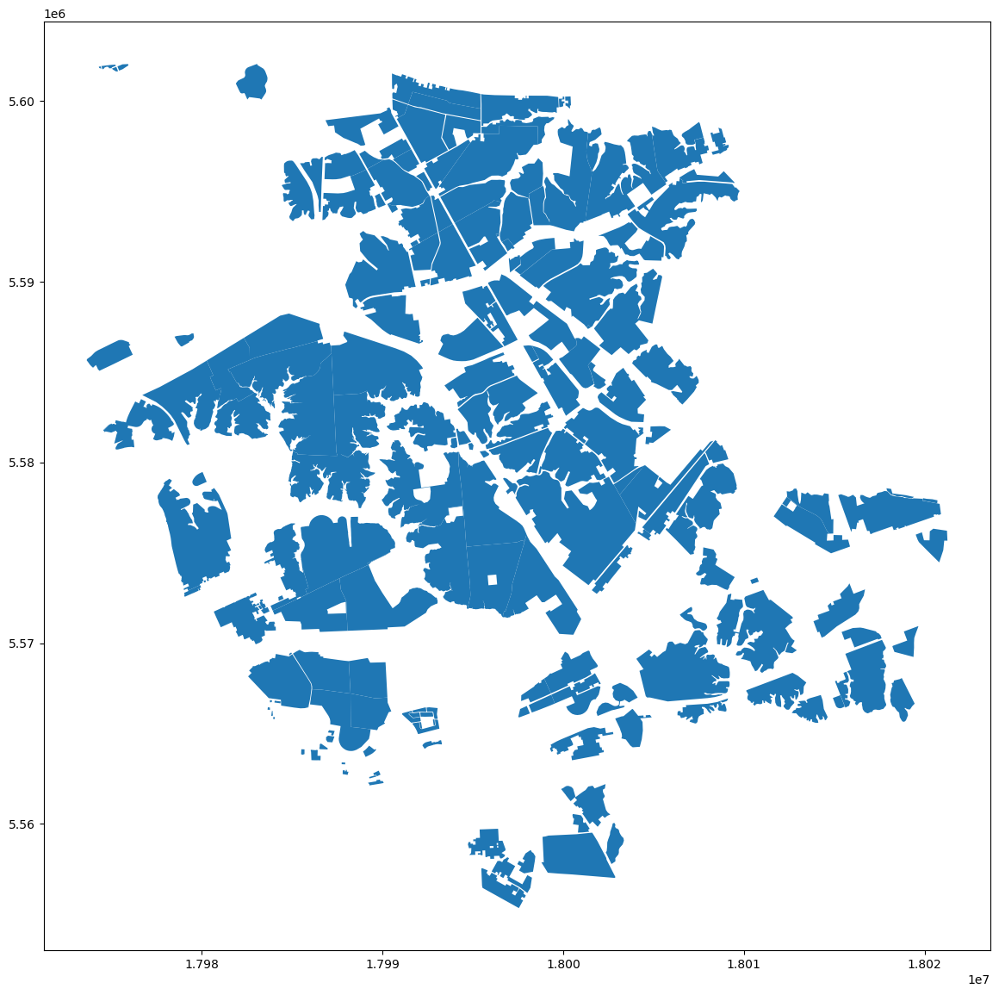

In [10]:
# Create GDF of residential areas in Norfolk based on API data
res_fet =  ox.geometries_from_place('Norfolk, Virginia',tags={'landuse':'residential'})

# Convert to working projection
res_fet = res_fet.to_crs(2230)

# Create a GDF for orf_raods
#roads_fet = gpd.GeoDataFrame(geometry=roads_fet)

# Clip Census tract data Using NLCD_Mask
res_mask = gpd.clip(orf_census,res_fet)

# Replace any 'nan' values with '0'
res_mask.Pop_Tot = res_mask.Pop_Tot.fillna(0)

# convert orf_clip to projection
res_mask = res_mask.to_crs(2230)

#Plot the GDF
fig, ax = plt.subplots(figsize=(20,14))
res_mask.plot(ax=ax)

# Method 1 - Masked Areal Interpolation

In [11]:
#Test 1 using Masked Area Interpolation and NLCD_mask
MAI_NLCD = masked_area_interpolate(raster=nlcd_lc, source_df=orf_census, target_df=NLCD_Mask,
                                    pixel_values=[22,23,24], intensive_variables=['pop_density'],
                                    extensive_variables=['Pop_Tot'])

MAI_NLCD= MAI_NLCD.to_crs(2230)

#Test 2 using Masked Area Interpolation and roads_mask
MAI_roads = masked_area_interpolate(raster=nlcd_lc, source_df=orf_census, target_df=roads_mask,
                                    pixel_values=[22,23,24], intensive_variables=['pop_density'],
                                    extensive_variables=['Pop_Tot'])

MAI_roads= MAI_roads.to_crs(2230)

#Test 3 using Masked Area Interpolation and res_mask
MAI_res = masked_area_interpolate(raster=nlcd_lc, source_df=orf_census, target_df=res_mask,
                                  pixel_values=[22,23,24], intensive_variables=['pop_density'],
                                  extensive_variables=['Pop_Tot'])

MAI_res= MAI_res.to_crs(2230)

In [12]:
MAI_NLCD

,Pop_Tot,pop_density,geometry
0,3167.000000,0.000075,"MULTIPOLYGON (((17993313.059 5560776.071, 1799..."
1,1418.000000,0.000189,"MULTIPOLYGON (((17993373.624 5560963.695, 1799..."
2,5249.000000,0.000245,"MULTIPOLYGON (((17988282.631 5563580.399, 1798..."
3,2966.999823,0.000177,"MULTIPOLYGON (((17995855.508 5562820.475, 1799..."
4,1913.999886,0.000239,"MULTIPOLYGON (((17992627.641 5564884.633, 1799..."
...,...,...,...
75,2469.999853,0.000148,"MULTIPOLYGON (((17998424.801 5592415.392, 1799..."
76,2099.999875,0.000113,"MULTIPOLYGON (((18001223.106 5592944.898, 1800..."
77,2338.000000,0.000208,"MULTIPOLYGON (((18005081.040 5597030.107, 1800..."
78,2460.000000,0.000227,"MULTIPOLYGON (((17999773.448 5599623.418, 1799..."


Text(0.5, 1.0, 'Norfolk, VA\nTotal Population')

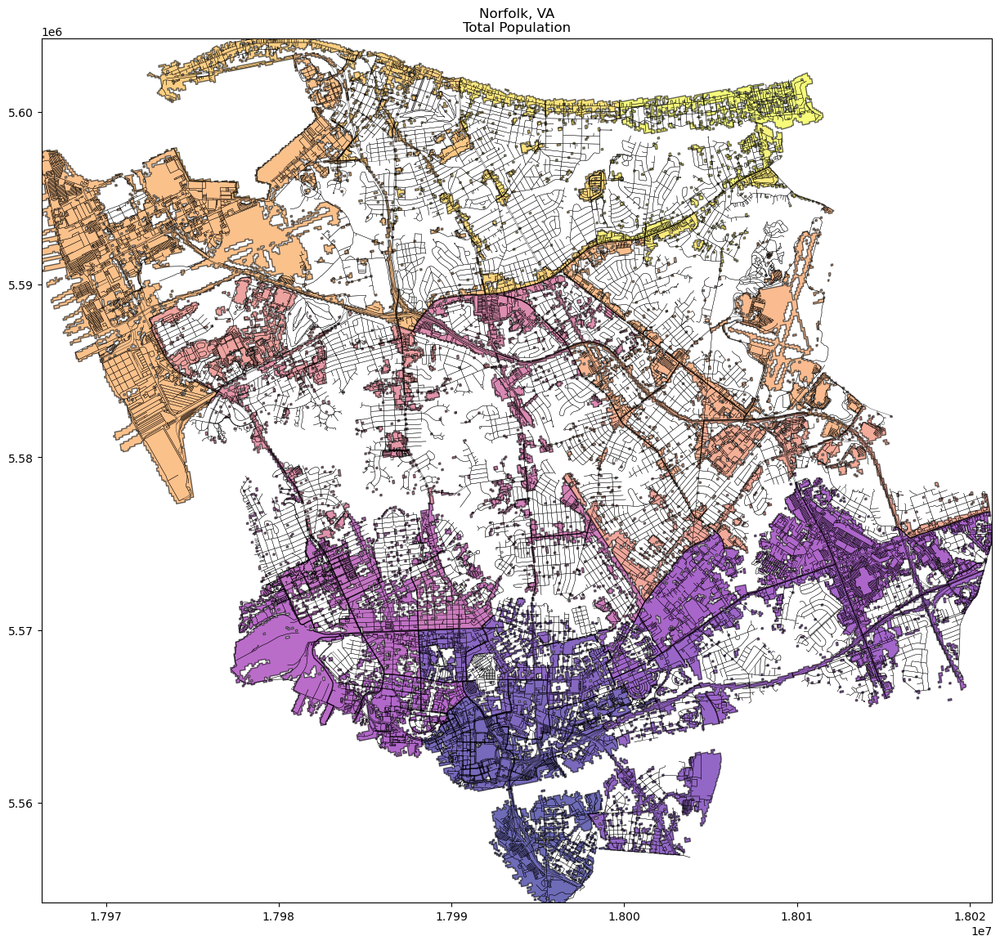

In [13]:
f,ax = plt.subplots(1,1, figsize=(15,15))
MAI_NLCD.plot(cmap='plasma', alpha=.6, ax=ax, linewidth=1, edgecolor='k')
orf_streets.plot(linewidth=.25, ax=ax, color='k')
ax.axis(orf_streets.total_bounds[[0,2,1,3]])
ax.set_title('Norfolk, VA\nTotal Population')

Text(0.5, 1.0, 'Norfolk, VA\nTotal Population')

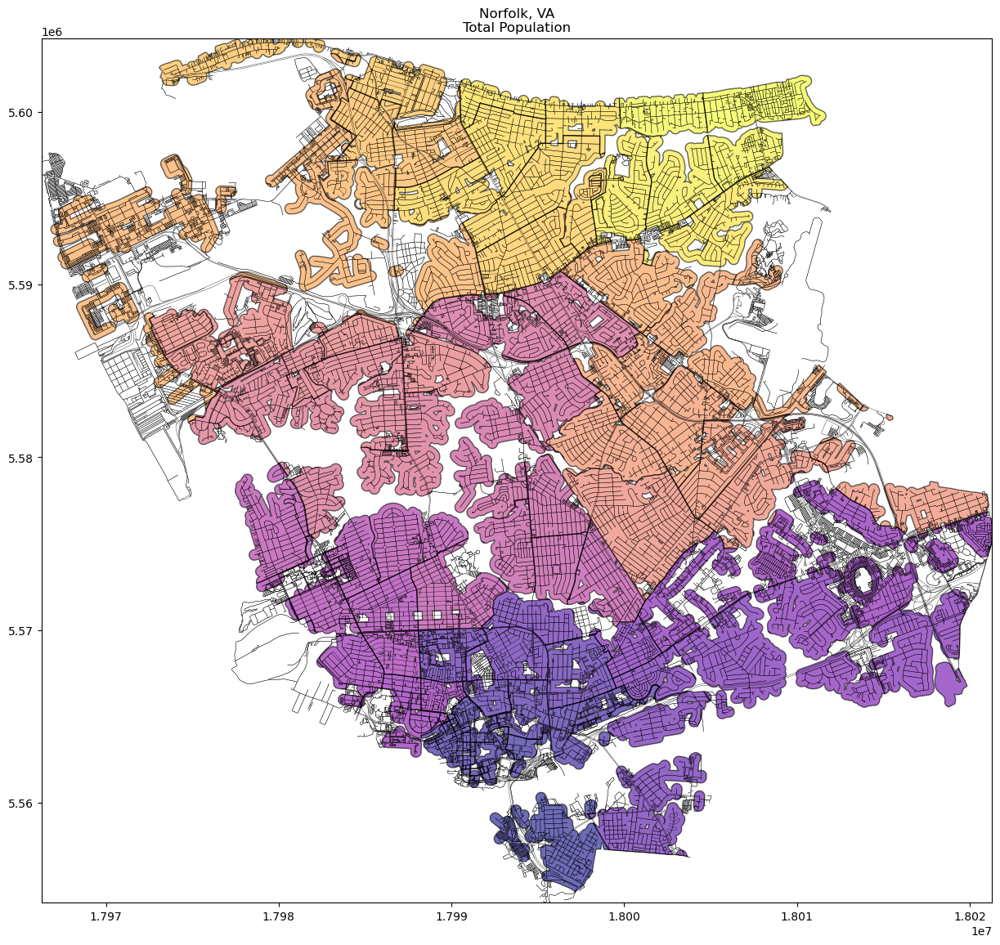

In [14]:
f,ax = plt.subplots(1,1, figsize=(15,15))
MAI_roads.plot(cmap='plasma', alpha=.6, ax=ax, linewidth=1, edgecolor='k')
orf_streets.plot(linewidth=.25, ax=ax, color='k')
ax.axis(orf_streets.total_bounds[[0,2,1,3]])
ax.set_title('Norfolk, VA\nTotal Population')

Text(0.5, 1.0, 'Norfolk, VA\nTotal Population')

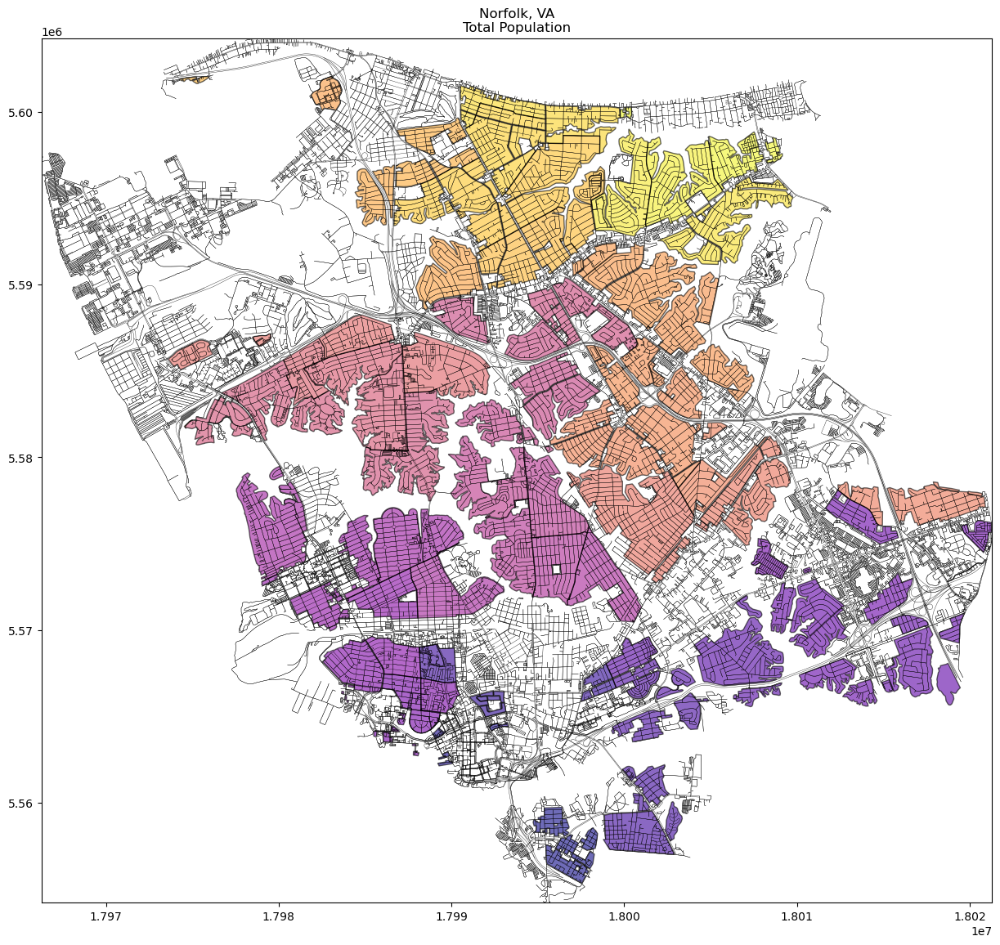

In [15]:
f,ax = plt.subplots(1,1, figsize=(15,15))
MAI_res.plot(cmap='plasma', alpha=.6, ax=ax, linewidth=1, edgecolor='k')
orf_streets.plot(linewidth=.25, ax=ax, color='k')
ax.axis(orf_streets.total_bounds[[0,2,1,3]])
ax.set_title('Norfolk, VA\nTotal Population')

There is a noticable error in that the circle in military circle is shown as having population

# Method 2 - Areal Interpolation

In [16]:
#Test 1 using Areal Interpolation and NLCD_mask
AI_NLCD = area_interpolate(source_df=orf_census, target_df=NLCD_Mask, extensive_variables=['Pop_Tot'])

AI_NLCD= AI_NLCD.to_crs(2230)

#Test 2 using Areal Interpolation and roads_mask
AI_roads = area_interpolate(source_df=orf_census, target_df=roads_mask, extensive_variables=['Pop_Tot'])

AI_roads= AI_roads.to_crs(2230)

#Test 3 using Areal Interpolation and res_mask
AI_res = area_interpolate(source_df=orf_census, target_df=res_mask, extensive_variables=['Pop_Tot'])

AI_res= AI_res.to_crs(2230)

Text(0.5, 1.0, 'Norfolk, VA\nTotal Population')

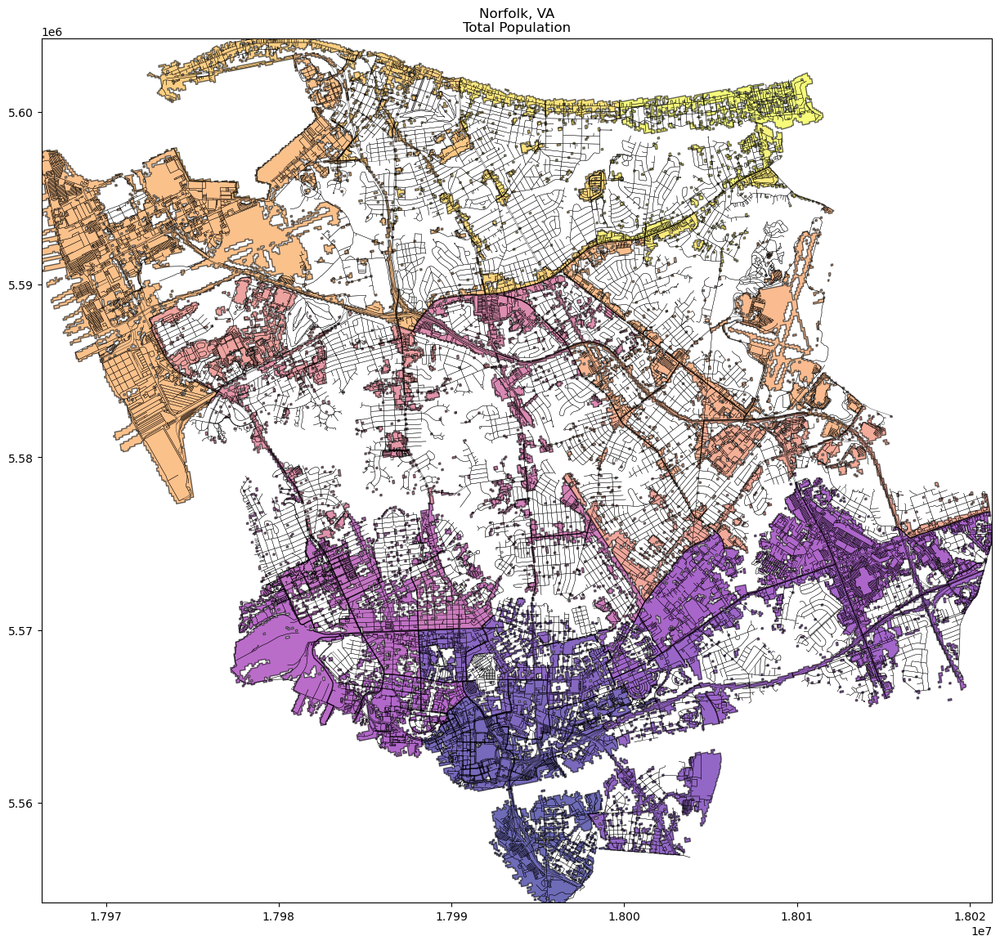

In [17]:
f,ax = plt.subplots(1,1, figsize=(15,15))
AI_NLCD.plot(cmap='plasma', alpha=.6, ax=ax, linewidth=1, edgecolor='k')
orf_streets.plot(linewidth=.25, ax=ax, color='k')
ax.axis(orf_streets.total_bounds[[0,2,1,3]])
ax.set_title('Norfolk, VA\nTotal Population')

Text(0.5, 1.0, 'Norfolk, VA\nTotal Population')

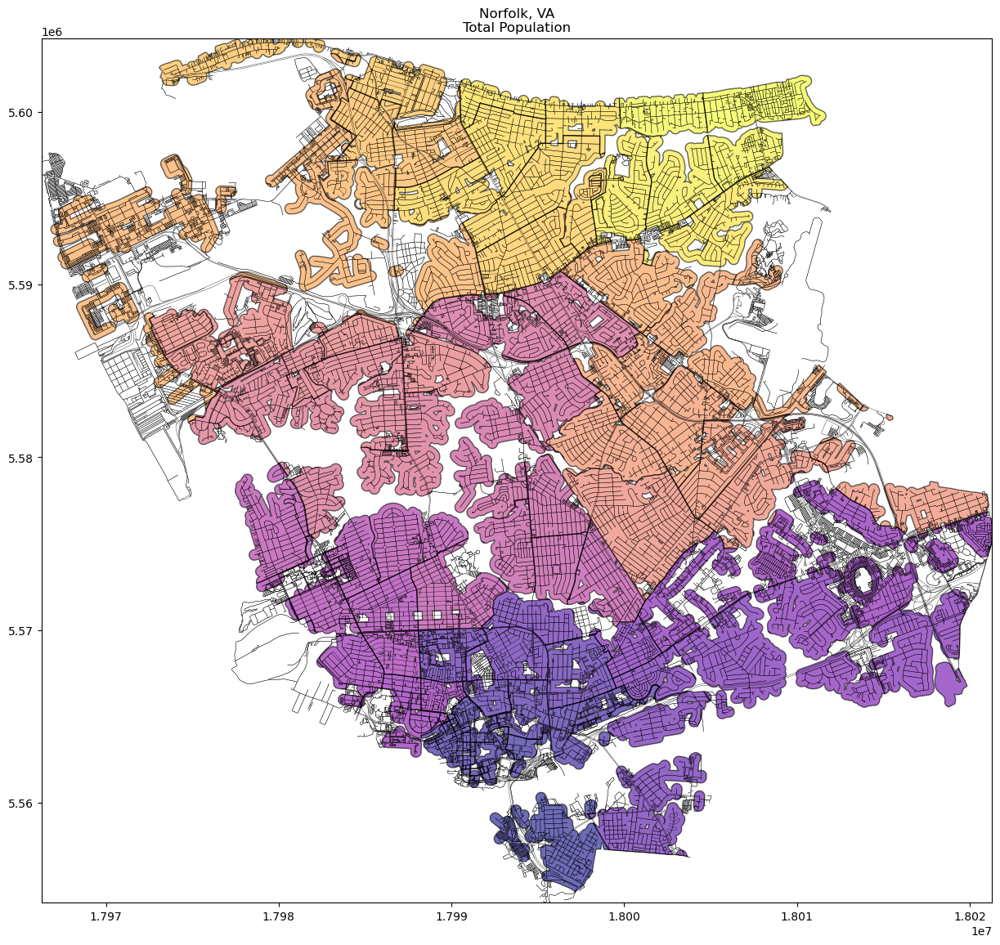

In [18]:
f,ax = plt.subplots(1,1, figsize=(15,15))
AI_roads.plot(cmap='plasma', alpha=.6, ax=ax, linewidth=1, edgecolor='k')
orf_streets.plot(linewidth=.25, ax=ax, color='k')
ax.axis(orf_streets.total_bounds[[0,2,1,3]])
ax.set_title('Norfolk, VA\nTotal Population')

Text(0.5, 1.0, 'Norfolk, VA\nTotal Population')

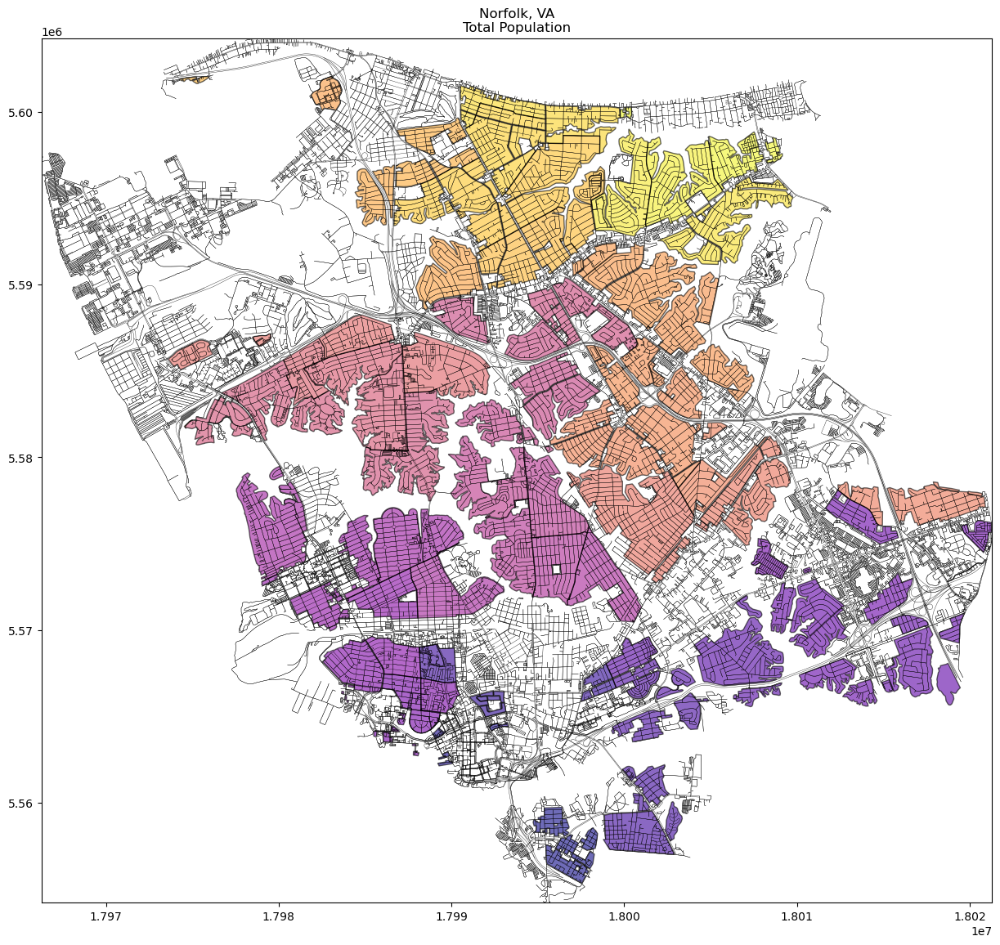

In [19]:
f,ax = plt.subplots(1,1, figsize=(15,15))
AI_res.plot(cmap='plasma', alpha=.6, ax=ax, linewidth=1, edgecolor='k')
orf_streets.plot(linewidth=.25, ax=ax, color='k')
ax.axis(orf_streets.total_bounds[[0,2,1,3]])
ax.set_title('Norfolk, VA\nTotal Population')

# Method 3 Generalized Linear Model

In [20]:
#Test 1 using GLM Interpolation and NLCD_mask
glm_NLCD = glm(raster=nlcd_lc,source_df=orf_census, target_df=NLCD_Mask, raster_codes=[23,24], variable='Pop_Tot', )
glm_NLCD.Pop_Tot = glm_NLCD.Pop_Tot.fillna(0)
glm_NLCD=glm_NLCD.to_crs(2230)

#Test 2 using GLM Interpolation and roads_mask
glm_roads = glm(raster=nlcd_lc,source_df=orf_census, target_df=roads_mask, raster_codes=[23,24], variable='Pop_Tot', )
glm_roads.Pop_Tot = glm_roads.Pop_Tot.fillna(0)
glm_roads=glm_roads.to_crs(2230)

#Test 3 using GLM Interpolation and res_mask
glm_res = glm(raster=nlcd_lc,source_df=orf_census, target_df=res_mask, raster_codes=[23,24], variable='Pop_Tot', )
glm_res.Pop_Tot = glm_res.Pop_Tot.fillna(0)
glm_res=glm_res.to_crs(2230)

C:\Users\Admin\anaconda3\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\Admin\anaconda3\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\Admin\anaconda3\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

Text(0.5, 1.0, 'Norfolk, VA\nTotal Population')

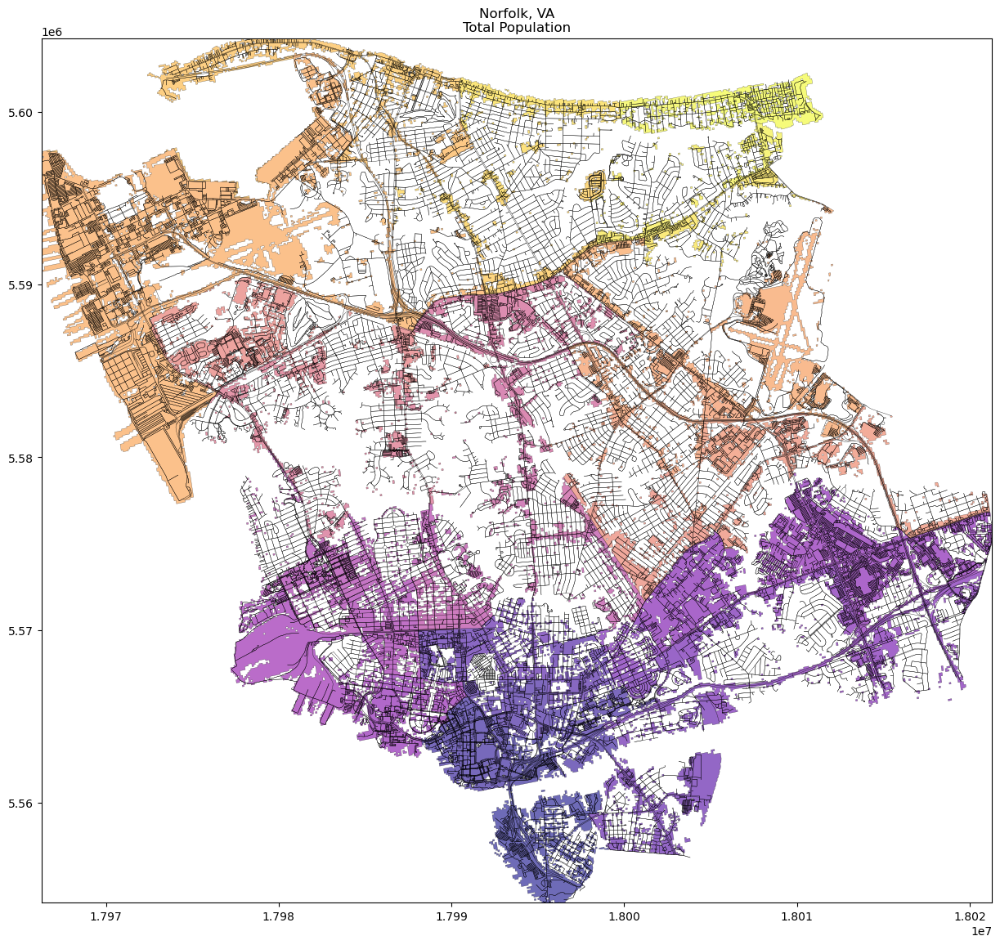

In [21]:
f,ax = plt.subplots(1,1, figsize=(15,15))
glm_NLCD.plot(cmap='plasma', alpha=.6, ax=ax, linewidth=.25, edgecolor='k')
orf_streets.plot(linewidth=.25, ax=ax, color='k')
ax.axis(orf_streets.total_bounds[[0,2,1,3]])
ax.set_title('Norfolk, VA\nTotal Population')

Text(0.5, 1.0, 'Norfolk, VA\nTotal Population')

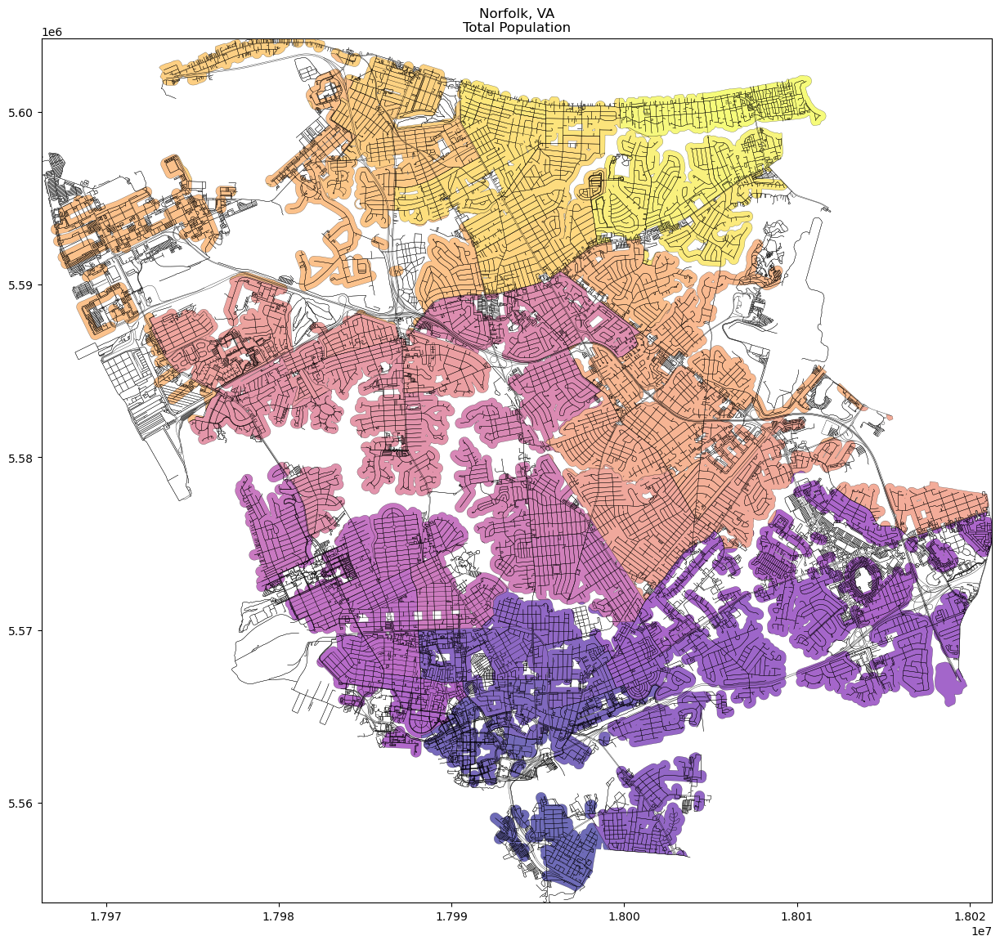

In [22]:
f,ax = plt.subplots(1,1, figsize=(15,15))
glm_roads.plot(cmap='plasma', alpha=.6, ax=ax, linewidth=.25, edgecolor='k')
orf_streets.plot(linewidth=.25, ax=ax, color='k')
ax.axis(orf_streets.total_bounds[[0,2,1,3]])
ax.set_title('Norfolk, VA\nTotal Population')

Text(0.5, 1.0, 'Norfolk, VA\nTotal Population')

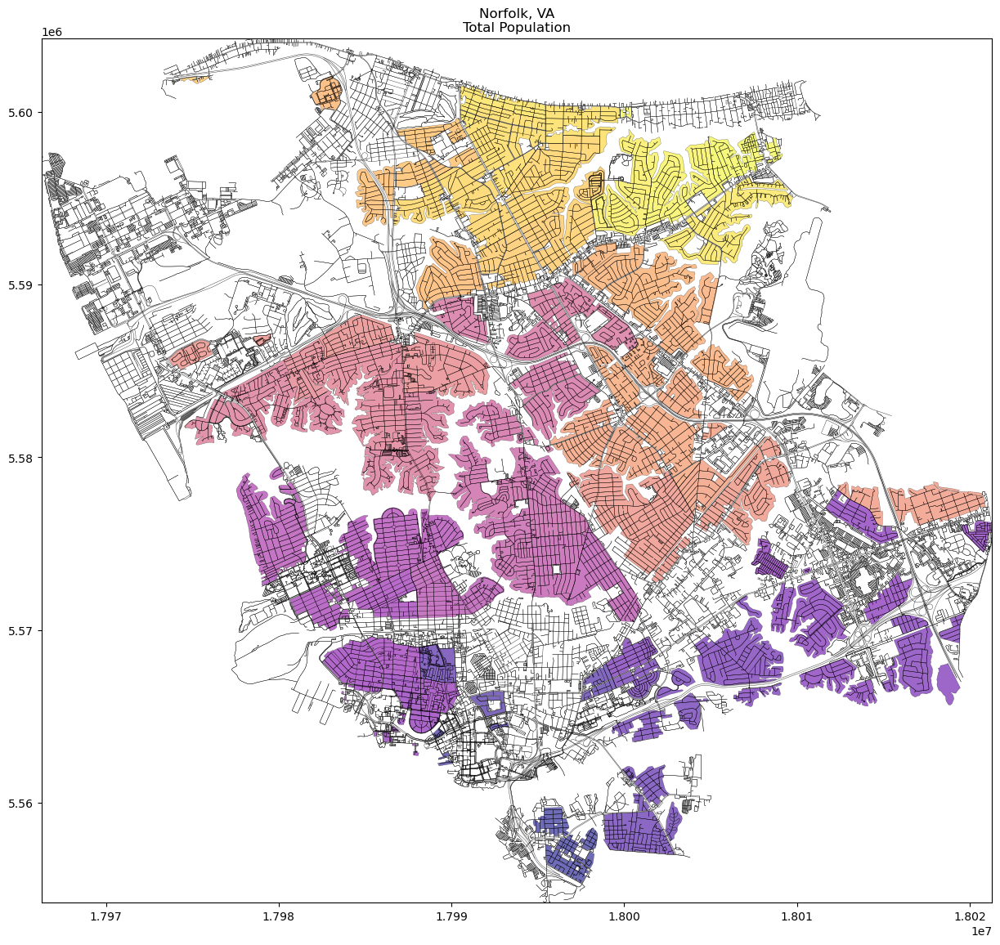

In [23]:
f,ax = plt.subplots(1,1, figsize=(15,15))
glm_res.plot(cmap='plasma', alpha=.6, ax=ax, linewidth=.25, edgecolor='k')
orf_streets.plot(linewidth=.25, ax=ax, color='k')
ax.axis(orf_streets.total_bounds[[0,2,1,3]])
ax.set_title('Norfolk, VA\nTotal Population')

# Evaluation of Developed Solution


## Accuracy Testing

In their paper "An Optimal Population Modeling Approach Using Geographically Weighted Regression Based on High-Resolution Remote Sensing Data: A Case Study in Dhaka City, Bangladesh", Roni and Jia used Root Mean Square Error to measure the accuracy of their models.I am measureing the accuracy of my maps using comparisons of the Mean Absolute Error (MAE) and the Root Mean Square Error (RMSE). Rather than running the same lines of code for each test, I created this function. It uses Tobler to calculate the population density for each polygon in the dasymetric map and then finds the MAE and RMSE for each test. The lower the result, the more accurate the map. 

In [24]:
def calculate_error(dasymetric_file, census_file):
    # Load dasymetric data
    dasymetric_data = dasymetric_file

    # Load census data
    census_data = census_file

    # Convert both files to the same CRS
    dasymetric_data = dasymetric_data.to_crs(2230)
    census_data = census_data.to_crs(2230)

    # Calculate dasymetric polygon areas
    dasymetric_data['polygon_area'] = dasymetric_data.geometry.area

    # Calculate population density for dasymetric polygons
    dasymetric_data['population_density'] = dasymetric_data['Pop_Tot'] / dasymetric_data.geometry.area

    # Calculate the predicted population data for each polygon in the dasymetric data
    dasymetric_data['predicted_population'] = dasymetric_data['population_density'] * dasymetric_data['polygon_area']

    # Spatially join the dasymetric and census data based on the tract ID
    joined_data = gpd.sjoin(dasymetric_data, census_data, how='inner', predicate='intersects', lsuffix='dasym', rsuffix='census')

    # Calculate the absolute difference between the predicted and actual population data
    joined_data['diff'] = joined_data['predicted_population'] - joined_data['Pop_Tot_census']

    # Calculate the MAE and RMSE between the predicted and actual population data for each tract
    mae = joined_data.groupby('GEOID')['diff'].apply(lambda x: x.abs().mean())
    rmse = joined_data.groupby('GEOID')['diff'].apply(lambda x: (x**2).mean()**0.5)
   
    return mae, rmse


In [25]:
mae1, rmse1,= calculate_error(AI_NLCD, orf_census)
mae2, rmse2 = calculate_error(AI_roads, orf_census)
mae3, rmse3 = calculate_error(AI_res, orf_census)
mae4, rmse4 = calculate_error(MAI_NLCD, orf_census)
mae5, rmse5 = calculate_error(MAI_roads, orf_census)
mae6, rmse6 = calculate_error(MAI_res, orf_census)
mae7, rmse7 = calculate_error(glm_NLCD, orf_census)
mae8, rmse8 = calculate_error(glm_roads, orf_census)
mae9, rmse9 = calculate_error(glm_res, orf_census)

In [26]:
MAE_df= pd.DataFrame({'AI_NLCD_MAE':mae1,
                        'AI_roads_MAE':mae2,
                        'AI_res_MAE':mae3,
                        'MAI_NLCD_MAE':mae4,
                        'MAI_roads_MAE':mae5,
                        'MAI_res_MAE':mae6,
                        'GLM_NLCD_MAE':mae7,
                        'GLM_roads_MAE':mae8,
                        'GLM_res_MAE':mae9})

In [27]:
RMSE_df= pd.DataFrame({'AI_NLCD_RMSE':rmse1,
                       'AI_roads_RMSE':rmse2,
                       'AI_res_RMSE':rmse3,
                       'MAI_NLCD_RMSE':rmse4,
                       'MAI_roads_RMSE':rmse5,
                       'MAI_res_RMSE':rmse6,
                       'GLM_NLCD_RMSE':rmse7,
                      'GLM_roads_RMSE':rmse8,
                      'GLM_res_RMSE':rmse9})

In [28]:
MAE_dfd= pd.DataFrame({'AI_NLCD_MAE':mae1.describe(),
                        'AI_roads_MAE':mae2.describe(),
                        'AI_res_MAE':mae3.describe(),
                        'MAI_NLCD_MAE':mae4.describe(),
                        'MAI_roads_MAE':mae5.describe(),
                        'MAI_res_MAE':mae6.describe(),
                        'GLM_NLCD_MAE':mae7.describe(),
                        'GLM_roads_MAE':mae8.describe(),
                        'GLM_res_MAE':mae9.describe()})

In [29]:
RMSE_dfd= pd.DataFrame({'AI_NLCD_RMSE':rmse1.describe(),
                       'AI_roads_RMSE':rmse2.describe(),
                       'AI_res_RMSE':rmse3.describe(),
                       'MAI_NLCD_RMSE':rmse4.describe(),
                       'MAI_roads_RMSE':rmse5.describe(),
                       'MAI_res_RMSE':rmse6.describe(),
                       'GLM_NLCD_RMSE':rmse7.describe(),
                      'GLM_roads_RMSE':rmse8.describe(),
                      'GLM_res_RMSE':rmse9.describe()})

In [30]:
MAE_dfd

,AI_NLCD_MAE,AI_roads_MAE,AI_res_MAE,MAI_NLCD_MAE,MAI_roads_MAE,MAI_res_MAE,GLM_NLCD_MAE,GLM_roads_MAE,GLM_res_MAE
count,80.000000,80.000000,68.000000,80.000000,80.000000,68.000000,80.000000,80.000000,68.000000
mean,1563.441948,1535.917787,798.448293,1563.441946,1535.917786,798.448280,2088.722319,1930.852957,2882.411860
std,1426.755811,1439.260186,989.444152,1426.755812,1439.260188,989.444136,1585.569808,1581.323019,3603.392415
min,260.500026,212.333375,0.000000,260.500000,212.333325,0.000000,337.932992,121.080620,79.139152
25%,803.212497,783.012500,174.000000,803.212497,783.012507,174.000000,1223.975725,1109.756595,1469.447859
50%,1156.937536,1118.690476,609.500000,1156.937553,1118.690487,609.500000,1621.284018,1472.361080,2204.213031
75%,1894.684069,1815.843750,886.500027,1894.684056,1815.843731,886.500000,2476.593142,2394.192434,2985.970975
max,10799.833333,10536.200017,5437.000000,10799.833333,10536.200000,5437.000000,12163.969017,13050.573362,27762.534927


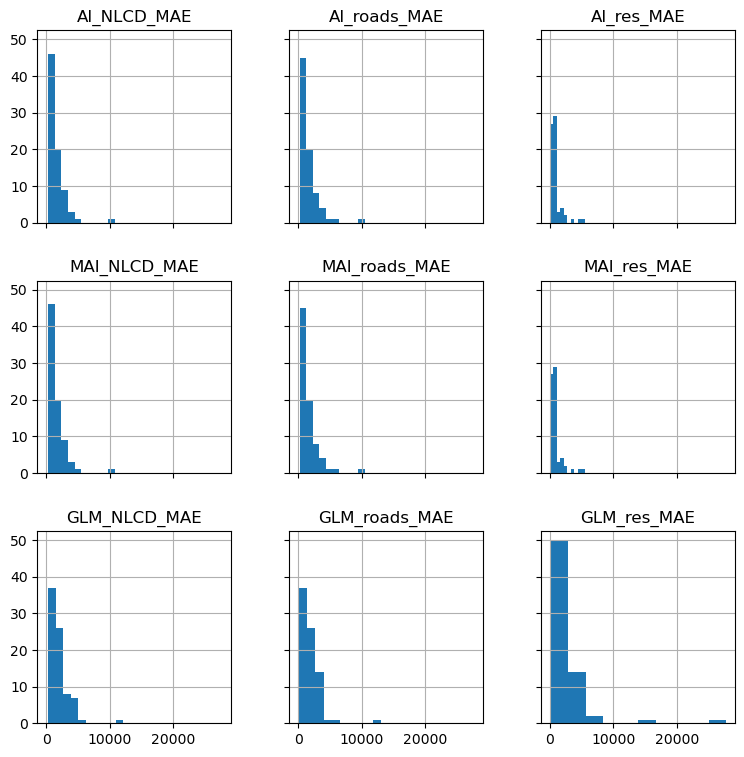

In [31]:
MAE_df.hist(figsize=(9, 9), sharex=True, sharey=True);

In [32]:
RMSE_dfd

,AI_NLCD_RMSE,AI_roads_RMSE,AI_res_RMSE,MAI_NLCD_RMSE,MAI_roads_RMSE,MAI_res_RMSE,GLM_NLCD_RMSE,GLM_roads_RMSE,GLM_res_RMSE
count,80.000000,80.000000,68.000000,80.000000,80.000000,68.000000,80.000000,80.000000,68.000000
mean,2141.576726,2069.512387,1087.422383,2141.576723,2069.512382,1087.422366,2525.142763,2217.191232,3099.409043
std,1844.250482,1855.850228,1368.906870,1844.250484,1855.850230,1368.906844,1890.012955,1648.701593,3642.065131
min,363.529251,268.231902,0.000000,363.529229,268.231784,0.000000,437.325631,147.087640,79.139152
25%,1078.140968,998.058557,240.349060,1078.140936,998.058551,240.349027,1454.173819,1346.029603,1595.859758
50%,1434.805641,1393.478232,848.624188,1434.805624,1393.478234,848.624188,1854.246676,1642.865215,2456.404596
75%,2420.471084,2204.277673,1168.572364,2420.471078,2204.277676,1168.572364,2848.436230,2859.875042,3099.245168
max,11319.036627,11152.015227,7689.079139,11319.036627,11152.015208,7689.079139,12268.505805,13124.746395,27762.534927


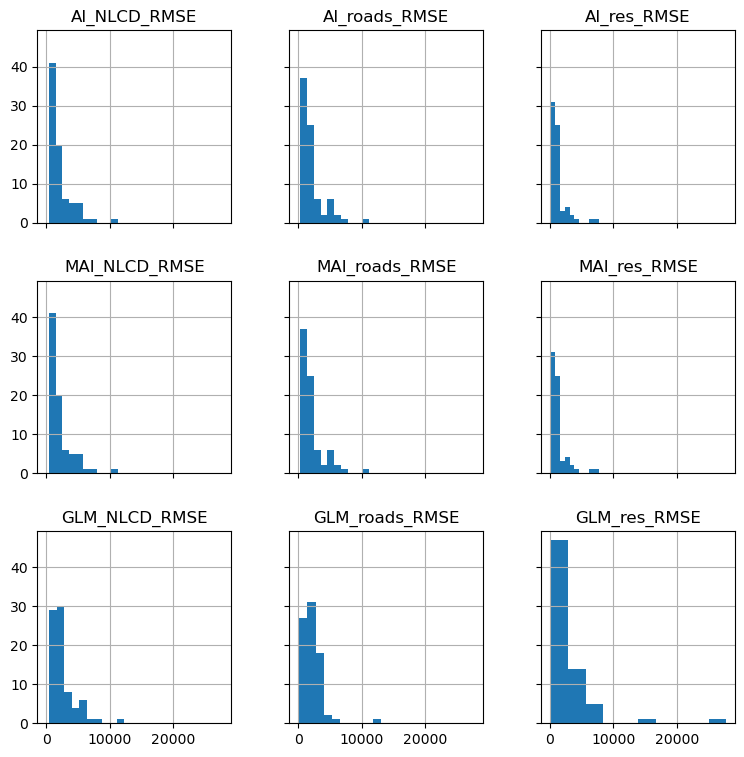

In [33]:
RMSE_df.hist(figsize=(9, 9), sharex=True, sharey=True);

It took over an hour do extract the data from teh raster to prepare the shape file

In [34]:
import fiona
fiona.supported_drivers 

{'AeronavFAA': 'r',
 'ARCGEN': 'r',
 'BNA': 'rw',
 'DXF': 'rw',
 'CSV': 'raw',
 'OpenFileGDB': 'raw',
 'ESRIJSON': 'r',
 'ESRI Shapefile': 'raw',
 'GeoJSON': 'raw',
 'GeoJSONSeq': 'raw',
 'GPKG': 'raw',
 'GML': 'rw',
 'OGR_GMT': 'rw',
 'GPX': 'rw',
 'GPSTrackMaker': 'rw',
 'Idrisi': 'r',
 'MapInfo File': 'raw',
 'DGN': 'raw',
 'PCIDSK': 'raw',
 'OGR_PDS': 'r',
 'S57': 'r',
 'SEGY': 'r',
 'SQLite': 'raw',
 'SUA': 'r',
 'TopoJSON': 'r'}

In [35]:
MAI_res.to_file('norfolkdasy.shp')

C:\Users\Admin\AppData\Local\Temp\ipykernel_19304\1170246421.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  MAI_res.to_file('norfolkdasy.shp')


# Major Contributions


# Conclusions

All thre methodologies preformed relatively well with the majority of the models having a MAE of less than 2000 people/sq mi. The RMSE error was larger, but it is more sensitive to outliers in the data, which all tests contained. I was surprised that the Masked Areal Interpolation method out performed the Linear Model. All of the models showed a right tailed distribution this indicates that all 9 tests tend to under-estimate the predicted population. I think there are three main issues with the data for my maps. First, it is difficult to account for uncertainty in the population data. For this project I was using data from the American Community Survey, which uses a 5-year estimate for population totals. Second, all of my masks rely on uncertain data. The NLCD is an excellent database, but 'developped' does not necesarilly mean residential. Though that mask tended to produce the smallest number of error and fewest outliers. I think that the Linear model method (GLM) has the potential to produce better results, but I need to do more work on model fit, and perhaps use a different distribution.

I would like to do more work with these methodologies and attempt some actual analysis, such as applying what I have learned here to emergency management or urban development problems. I can see how this is a really useful took for the sharing of GIS data as a completed script could be uploaded and used by GIS teams who may not have access to some resources.

For my final conclusions, I think that using a Jupyter Notebook and Python for analysis is a great alternative to commercial software packages. There is defenantly a learning curve and having a good knowledge of GIS workflows is a must. 



# References/Bibliography

Boeing, G. 2017. OSMnx: New Methods for Acquiring, Constructing, Analyzing, and Visualizing Complex Street Networks. Computers, Environment and Urban Systems 65, 126-139. doi:10.1016/j.compenvurbsys.2017.05.004

Roni, Rezaul & Jia, Peng. (2020). An Optimal Population Modeling Approach Using Geographically Weighted Regression Based on High-Resolution Remote Sensing Data: A Case Study in Dhaka City, Bangladesh. Remote Sensing. 12. 1184. 10.3390/rs12071184. 

Cenpy Developers. (2018). Cenpy. Retrieved from Cenpy: https://cenpy-devs.github.io/cenpy/
City of Norfolk. (2023). What are the typical setbacks for residential properties? Retrieved from The City of Norfolk: https://www.norfolk.gov/FAQ.aspx?QID=594

GeoPandas Developers. (2023). GeoPandas. Retrieved from geopandas.GeoDataFrame.to_file: https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.to_file.html

GeoPandas Developers. (2023). geopandas.sjoin. Retrieved from GeoPandas: https://geopandas.org/en/stable/docs/reference/api/geopandas.sjoin.html

PySAL Developers. (2018). Overview of Toblers Interpolation Methods. Retrieved from Tobler: https://pysal.org/tobler/notebooks/01_interpolation_methods_overview.html

Tobler, W. (1995). The Global Demography Project. In ESRI (Ed.), Proceedings, (p. 362). Retrieved from https://proceedings.esri.com/library/userconf/proc95/to400/p362.html

U.S. Census Bureau. (2023). History. Retrieved from United States Census Bureau: https://www.census.gov/history/www/reference/maps/population_distribution_over_time.html

US Census Bureau. (2023). US Census Bureau. Retrieved from Land Area and Persons Per Square Mile: https://www.census.gov/quickfacts/fact/note/US/POP060210#:~:text=Persons%20per%20square%20mile%20%2D%20population,miles%20or%20in%20square%20kilometers.

Nagle NN, Buttenfield BP, Leyk S, Speilman S. Dasymetric Modeling and Uncertainty. Ann Assoc Am Geogr. 2014 Jan 1;104(1):80-95. doi: 10.1080/00045608.2013.843439. PMID: 25067846; PMCID: PMC4109831. Retrieved from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4109831/#R28